In [1]:


import torch
import torch.nn as nn
import numpy as np
import pandas as pd

from torch.utils.data import Dataset

import pandas, random, numpy
import matplotlib.pyplot as plt

from PIL import Image, ImageOps


import glob
import PIL

from sklearn.model_selection import train_test_split


In [2]:

civs_path = 'data/imgs.new.CIVS'


In [3]:

path  = civs_path

paths = glob.glob(path + "/*.jpg") # Grabbing all the image file names

n_images = len(paths)

rand_idxs = np.random.permutation(n_images)

paths_subset = np.random.choice(paths, n_images , replace=False) 
all_paths    = paths_subset[rand_idxs]

print(n_images)


5016


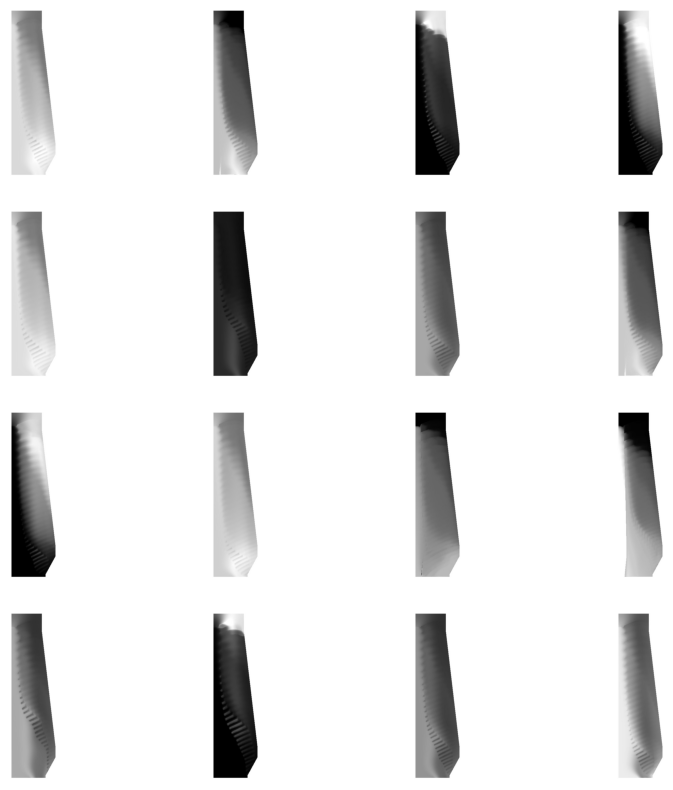

In [4]:

_, axes = plt.subplots(4, 4, figsize=(10, 10))

for ax, img_path in zip(axes.flatten(), all_paths):
    ax.imshow(Image.open(img_path))
    ax.axis("off")


In [5]:

## data/imgs.new.CIVS/h2_Ng90_Pci0_H0_Wp0_Ph300_Ox27_Ow3.0_Hbt1410_Wm12.2_Wr308750.4.jpg
## data/imgs.new.CIVS/h2o_Ng0_Pci150_H0_Wp0_Ph300_Ox24_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg
## data/imgs.new.CIVS/h2_Ng40_Pci60_H0_Wp0_Ph300_Ox23_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg

    
## ['tg', 'Ng0', 'Pci175', 'H0', 'Wp0', 'Ph300', 'Ox24', 'Ow7', 'Hbt1459.8', 'Wm12.2', 'Wr308750.4']
    


In [6]:

'''

['tg',  'Ng120', 'Pci0', 'H0', 'Wp0', 'Ph300', 'Ox30', 'Ow3.0', 'Hbt1485', 'Wm12.2', 'Wr308750.4']
['h2o', 'Ng70', 'Pci0', 'H0', 'Wp0', 'Ph500', 'Ox24', 'Ow5.0', 'Hbt1459.8', 'Wm12.2', 'Wr308750.4']
['co2', 'Ng50', 'Pci200', 'H0', 'Wp0', 'Ph300', 'Ox30', 'Ow4', 'Hbt1459.8', 'Wm12.2', 'Wr308750.4']


'''


"\n\n['tg',  'Ng120', 'Pci0', 'H0', 'Wp0', 'Ph300', 'Ox30', 'Ow3.0', 'Hbt1485', 'Wm12.2', 'Wr308750.4']\n['h2o', 'Ng70', 'Pci0', 'H0', 'Wp0', 'Ph500', 'Ox24', 'Ow5.0', 'Hbt1459.8', 'Wm12.2', 'Wr308750.4']\n['co2', 'Ng50', 'Pci200', 'H0', 'Wp0', 'Ph300', 'Ox30', 'Ow4', 'Hbt1459.8', 'Wm12.2', 'Wr308750.4']\n\n\n"

In [10]:

def label_func2(fname):
    ## print(fname)
    fname = fname.replace("data/imgs.new.CIVS/","")
    temp_name = fname.replace(".jpg", "").split("_")
    ## print(temp_name)
    
  
    y0 = temp_name[0]                              ## tg
    y1 = float(temp_name[1].replace("Ng", ""))     ## 'Ng0'
    y2 = float(temp_name[2].replace("Pci", ""))    ## 'Pci175'
    y3 = float(temp_name[3].replace("H", ""))     ## 'H0'
    y4 = float(temp_name[4].replace("Wp", ""))     ## 'Wp0'
    y5 = float(temp_name[5].replace("Ph", ""))     ## 'Ph300'
    y6 = float(temp_name[6].replace("Ox", ""))    ## 'Ox24'
    y7 = float(temp_name[7].replace("Ow", ""))     ## 'Ow7
    y8 = float(temp_name[8].replace("Hbt", ""))    ## 'Hbt1459.8'
    y9 = float(temp_name[9].replace("Wm", ""))    ## 'Wm12.2'
    y10 = float(temp_name[10].replace("Wr", ""))    ## 'Wr308750.4'
    
 
    ## np.array([y0, y1, y2, y3, y4, y5, y6, y7, y8, y9, y10 ])
    return [fname, y0, y1, y2, y3, y4, y5, y6, y7, y8, y9, y10 ]


In [15]:

## 1400, 390
## x 0.2
## 280 , 78
## 140, 39   ## for web tool


list_imgs = []
list_label_vectors = []

for img_name in all_paths:
    ##print(img_name)
    
    my_img = Image.open(img_name)
    
    my_img = my_img.resize((39, 140))

    my_img = ImageOps.grayscale(my_img)

    img_np = np.array(my_img)
    
    ## data = np.array(my_img)
    ## print(data)
    ## input()

    ## img_np = img_np.reshape(-1)
    
    temp_label_vector_rc = label_func2(img_name)
    if temp_label_vector_rc[1] == "tg":
    
        ## print(img_np.shape)
        list_imgs.append(img_np)

        list_label_vectors.append( temp_label_vector_rc )


In [16]:

X =  list_imgs
y =  list_label_vectors 


In [17]:

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

#######################################################

print(len(X_train))
print(len(X_test))
print(len(y_train))
print(len(y_test))


668
168
668
168


In [20]:

X_train[0]


array([[255, 255, 255, ..., 255, 255, 255],
       [255, 170, 137, ..., 255, 255, 255],
       [255, 113,  56, ..., 255, 255, 255],
       ...,
       [255, 189, 162, ..., 255, 255, 255],
       [255, 242, 238, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8)

In [21]:

list_ids_train      = []
list_features_train = []
list_imgs_train     = []


for index in range(len(X_train)):
    
    # image target (label)
    reg_vals = y_train[index]
    target = np.zeros( (10) )
    
    target[ 0 ] = reg_vals[2]
    target[ 1 ] = reg_vals[3]
    target[ 2 ] = reg_vals[4]
    target[ 3 ] = reg_vals[5]
    target[ 4 ] = reg_vals[6]
    target[ 5 ] = reg_vals[7]
    target[ 6 ] = reg_vals[8]
    target[ 7 ] = reg_vals[9]
    target[ 8 ] = reg_vals[10]
    target[ 9 ] = reg_vals[11]

    # image data, normalised from 0-255 to 0-1
    single_np_img = X_train[index]
    ## image_values = torch.FloatTensor(  single_np_img.astype(float)  ) / 255.0
    ## image_values = torch.FloatTensor(  single_np_img.astype(float)  ).permute(2,0,1).view(1,3,280,80) / 255.0
    

        
    list_ids_train.append(          reg_vals[0]                )
    list_imgs_train.append(        single_np_img               )
    list_features_train.append(    target      )


In [25]:

list_imgs_train[0]


array([[255, 255, 255, ..., 255, 255, 255],
       [255, 170, 137, ..., 255, 255, 255],
       [255, 113,  56, ..., 255, 255, 255],
       ...,
       [255, 189, 162, ..., 255, 255, 255],
       [255, 242, 238, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8)

In [22]:


list_ids_test      = []
list_features_test = []
list_imgs_test     = []


for index in range(len(X_test)):
    
    # image target (label)
    reg_vals = y_test[index]
    target = np.zeros( (10) )
    
    target[ 0 ] = reg_vals[2]
    target[ 1 ] = reg_vals[3]
    target[ 2 ] = reg_vals[4]
    target[ 3 ] = reg_vals[5]
    target[ 4 ] = reg_vals[6]
    target[ 5 ] = reg_vals[7]
    target[ 6 ] = reg_vals[8]
    target[ 7 ] = reg_vals[9]
    target[ 8 ] = reg_vals[10]
    target[ 9 ] = reg_vals[11]

    # image data, normalised from 0-255 to 0-1
    single_np_img = X_test[index]
    ## image_values = torch.FloatTensor(  single_np_img.astype(float)  ) / 255.0
    ## image_values = torch.FloatTensor(  single_np_img.astype(float)  ).permute(2,0,1).view(1,3,280,80) / 255.0
        
    list_ids_test.append(          reg_vals[0]                )
    list_imgs_test.append(        single_np_img               )
    list_features_test.append(    target      )




In [23]:

conditions_matrix_train = np.array( list_features_train )
conditions_matrix_test  = np.array( list_features_test )


In [24]:

print( conditions_matrix_train.shape )
print( conditions_matrix_test.shape  )


(668, 10)
(168, 10)



## Save data for deployment


In [ ]:


DF_conditions_train = pd.DataFrame(conditions_matrix_train)
DF_conditions_train.to_csv("PD_conditions_train.csv")


In [ ]:

DF_ids_train = pd.DataFrame(list_ids_train)
DF_ids_train.to_csv("PD_ids_train.csv")


In [28]:

list_imgs_train[17]
    


array([[255, 255, 255, ..., 255, 255, 255],
       [254, 163, 128, ..., 255, 255, 255],
       [255, 102,  40, ..., 255, 255, 255],
       ...,
       [255, 233, 224, ..., 255, 255, 255],
       [255, 251, 249, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8)

In [29]:

list_imgs_train_stretched = [     the_img_np.reshape(-1)         for the_img_np in list_imgs_train]


In [30]:

list_imgs_train_stretched[0]


array([255, 255, 255, ..., 255, 255, 255], dtype=uint8)

In [39]:

list_imgs_train_stretched[4].shape


(5460,)

In [40]:

list_imgs_train_stretched[4][:1000]


array([255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 174, 142, 143, 141, 138, 135, 130, 124, 119, 115, 110, 107,
       103, 101,  99,  99,  99,  99,  99,  99,  99,  99,  99,  99,  99,
       188, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 119,  64,  66,  62,  57,  51,  44,  33,  26,  17,   9,   3,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
       143, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 125,  74,  75,  71,  66,  60,  53,  43,  34,  26,  18,  12,
         6,   2,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
       147, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 128,  76,  78,  74,  68,  62,  54,  43,  34,  26,  18,  11,
         5,   1,   0,   0,   0,   0,   0,   0,   0,   0,   0,   

In [43]:

list_imgs_train_stretched[7].shape


(5460,)


## Keeps scale at 0..255


In [54]:

np_list_imgs_train_stretched = np.array( list_imgs_train_stretched )  


In [55]:

np_list_imgs_train_stretched.shape


(668, 5460)

In [56]:

np_list_imgs_train_stretched[3]


array([255, 255, 255, ..., 255, 255, 255], dtype=uint8)

In [57]:

DF_imgs_np_train = pd.DataFrame(np_list_imgs_train_stretched)


In [58]:

DF_imgs_np_train


,0,1,2,3,4,5,6,7,8,9,...,5450,5451,5452,5453,5454,5455,5456,5457,5458,5459
0,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
1,254,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
2,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
3,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
4,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
663,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
664,254,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
665,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
666,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255


In [63]:

DF_imgs_np_train.to_csv("PD_imgs_np_train.csv")



## KNN part


In [64]:

def euclidean_distance(v1, v2):
    return np.sqrt( np.sum(   (v1 - v2)**2   )   )


In [65]:

def predict(test_x):
    
    ## calculate distances between test_x and all dta samples in x
    ## this distances vector is a vector of 45 distances
    ## distances = [ euclidean_distance(test_x , x)  for x in X_train    ]

    distances = [ euclidean_distance(test_x, x )  for x in conditions_matrix_train   ]
      
    
    ## distances - > [23, 3, 145, 17, ...]
    
    k = 3
    
    ## sort by distance value and return the k nearest neighbors
    ## np.argsort returns the indices of the k neares neighbors
    k_neighbor_indices = np.argsort(distances)[:k]
    print(k_neighbor_indices)
    
    
    ## with indices, extract labels from y_train 
    img_names = [ list_ids_train[i]  for i in k_neighbor_indices  ]
    ## imagine labels = [ 1, 1, 2, 0, 1]
    
    ## from labels, select the most common label
    ## most_common_label = Counter(labels).most_common(1)
    
    return img_names
    


In [66]:

def generate_img_per_index(index):
    
    res = predict( conditions_matrix_test[  index  ] )
    the_test_conditions = conditions_matrix_test[  index  ]
    print(res)
      
    selected_imgs_to_avg = []

    for img_name in res:
        img_name = "data/imgs.new.CIVS/" + img_name
        my_img = Image.open(img_name)
        ## my_img = my_img.resize((80, 280))
        my_img = ImageOps.grayscale(my_img)
        img_np = np.array(my_img)
        ## img_np = img_np.reshape(-1)
        selected_imgs_to_avg.append(img_np)
    avg_gen_img = np.mean( np.array(selected_imgs_to_avg), axis=0 )
    print(avg_gen_img.shape)
    print(avg_gen_img)
    gen_pil_image  = Image.fromarray(avg_gen_img).convert('L')
    print(gen_pil_image)
    
    real_my_img = np.array(list_imgs_test[index])
    real_pil_image = Image.fromarray(real_my_img)
    real_pil_image = ImageOps.grayscale(real_pil_image)
    
    print(gen_pil_image)
    print(real_pil_image)
    
    return the_test_conditions, gen_pil_image, real_pil_image
    



## Inference


(668, 10)
(168, 10)
[168 605 533]
['tg_Ng120_Pci0_H0_Wp0_Ph300_Ox30_Ow5.0_Hbt1410_Wm12.2_Wr308750.4.jpg', 'tg_Ng120_Pci0_H0_Wp0_Ph300_Ox30_Ow7.0_Hbt1410_Wm12.2_Wr308750.4.jpg', 'tg_Ng120_Pci0_H0_Wp0_Ph300_Ox30_Ow8.0_Hbt1410_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7D09B61A90>
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7D09B61A90>
<PIL.Image.Image image mode=L size=39x140 at 0x7F7D09B619D0>
120,0,0,0,300,30,6,1410,12,308750


Text(0.5, 1.0, 'real')

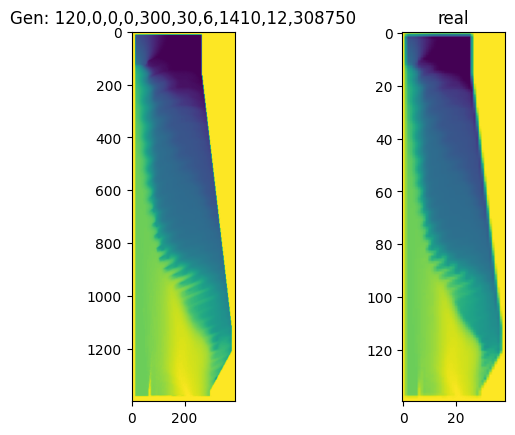

In [74]:



print( conditions_matrix_train.shape )
print( conditions_matrix_test.shape  )

the_test_conditions, gen_pil_image, real_pil_image = generate_img_per_index(17)


the_test_conditions = the_test_conditions.astype(int)
str_conditions = np.array2string(the_test_conditions, precision=0, separator=',', suppress_small=True)
str_conditions = str_conditions.replace(" ","")
str_conditions = str_conditions.replace("[","")
str_conditions = str_conditions.replace("]","")

print(str_conditions)
                 

fig, ax = plt.subplots(1,2)

ax[0].imshow(gen_pil_image)
ax[1].imshow(real_pil_image)

ax[0].set_title("Gen: " + str_conditions)
ax[1].set_title("real")




(668, 10)
(168, 10)
[483 508 150]
['tg_Ng70_Pci0_H0_Wp0_Ph500_Ox30_Ow8.0_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng70_Pci0_H0_Wp0_Ph500_Ox30_Ow6.0_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng70_Pci0_H0_Wp0_Ph500_Ox30_Ow5.0_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7CD8972350>
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7CD8972350>
<PIL.Image.Image image mode=L size=39x140 at 0x7F7CD8972C90>
[227 526 305]
['tg_Ng0_Pci175_H0_Wp0_Ph300_Ox24_Ow3_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci175_H0_Wp0_Ph300_Ox24_Ow7_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci175_H0_Wp0_Ph300_Ox27_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 2

(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7CFAAD3690>
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7CFAAD3690>
<PIL.Image.Image image mode=L size=39x140 at 0x7F7CFB5F0890>
[478  76 604]
['tg_Ng120_Pci30_H0_Wp0_Ph300_Ox25_Ow9_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng120_Pci30_H0_Wp0_Ph300_Ox25_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng120_Pci30_H0_Wp0_Ph300_Ox25_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7D09E82CD0>
<PIL.Image.Image image mode=L size=390x

/Users/user/opt/anaconda3/envs/py37_new_GANs_Torch/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  app.launch_new_instance()


[154  20 538]
['tg_Ng0_Pci38_H0_Wp0_Ph300_Ox24_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci38_H0_Wp0_Ph300_Ox24_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci38_H0_Wp0_Ph300_Ox24_Ow7_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7C8A65BB90>
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7C8A65BB90>
<PIL.Image.Image image mode=L size=39x140 at 0x7F7C8A65BE50>
[493 197 136]
['tg_Ng10_Pci40_H0_Wp0_Ph300_Ox21_Ow3_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng10_Pci40_H0_Wp0_Ph300_Ox21_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng10_Pci40_H0_Wp0_Ph300_Ox21_Ow8_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255

(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7CFC2732D0>
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7CFC2732D0>
<PIL.Image.Image image mode=L size=39x140 at 0x7F7CFBFA9250>
[251  68 117]
['tg_Ng150_Pci100_H0_Wp0_Ph300_Ox30_Ow9_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng150_Pci100_H0_Wp0_Ph300_Ox30_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng150_Pci100_H0_Wp0_Ph300_Ox30_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7CD8F2E310>
<PIL.Image.Image image mode=L size=3

(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7CFC927990>
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7CFC927990>
<PIL.Image.Image image mode=L size=39x140 at 0x7F7C8AC2C910>
[283 553 191]
['tg_Ng0_Pci200_H0_Wp0_Ph300_Ox30_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci200_H0_Wp0_Ph300_Ox30_Ow7_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci200_H0_Wp0_Ph300_Ox30_Ow3_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7CFC9E71D0>
<PIL.Image.Image image mode=L size=390x140

[610 480 166]
['tg_Ng120_Pci0_H0_Wp0_Ph300_Ox24_Ow8_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng120_Pci0_H0_Wp0_Ph300_Ox24_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng120_Pci0_H0_Wp0_Ph300_Ox24_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7CFD69A4D0>
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7CFD69A4D0>
<PIL.Image.Image image mode=L size=39x140 at 0x7F7CFD69A790>
[227 526  96]
['tg_Ng0_Pci175_H0_Wp0_Ph300_Ox24_Ow3_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci175_H0_Wp0_Ph300_Ox24_Ow7_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci175_H0_Wp0_Ph300_Ox27_Ow4_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 

[111 597 450]
['tg_Ng0_Pci38_H0_Wp0_Ph300_Ox30_Ow8_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci38_H0_Wp0_Ph300_Ox30_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci38_H0_Wp0_Ph300_Ox30_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7CFD9D5210>
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7CFD9D5210>
<PIL.Image.Image image mode=L size=39x140 at 0x7F7CFD9D54D0>
[115 542 235]
['tg_Ng0_Pci200_H0_Wp0_Ph300_Ox21_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci200_H0_Wp0_Ph300_Ox21_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci200_H0_Wp0_Ph300_Ox24_Ow7_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255

[504 238 546]
['tg_Ng70_Pci0_H0_Wp0_Ph300_Ox21_Ow8.0_Hbt1485_Wm12.2_Wr308750.4.jpg', 'tg_Ng70_Pci0_H0_Wp0_Ph300_Ox21_Ow7.0_Hbt1485_Wm12.2_Wr308750.4.jpg', 'tg_Ng70_Pci0_H0_Wp0_Ph300_Ox21_Ow6.0_Hbt1485_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7CFE0FE450>
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7CFE0FE450>
<PIL.Image.Image image mode=L size=39x140 at 0x7F7C8BA572D0>
[631 640 428]
['tg_Ng90_Pci0_H0_Wp0_Ph300_Ox21_Ow8.0_Hbt1485_Wm12.2_Wr308750.4.jpg', 'tg_Ng90_Pci0_H0_Wp0_Ph300_Ox21_Ow6.0_Hbt1485_Wm12.2_Wr308750.4.jpg', 'tg_Ng90_Pci0_H0_Wp0_Ph300_Ox24_Ow9.0_Hbt1485_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]


[377 611 534]
['tg_Ng0_Pci150_H0_Wp0_Ph300_Ox21_Ow8_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci150_H0_Wp0_Ph300_Ox24_Ow9_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci150_H0_Wp0_Ph300_Ox24_Ow8_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7CFE7D5A10>
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7CFE7D5A10>
<PIL.Image.Image image mode=L size=39x140 at 0x7F7CD9A12290>
[158 229 308]
['tg_Ng150_Pci0_H0_Wp0_Ph300_Ox24_Ow4.0_Hbt1410_Wm12.2_Wr308750.4.jpg', 'tg_Ng150_Pci0_H0_Wp0_Ph300_Ox24_Ow5.0_Hbt1410_Wm12.2_Wr308750.4.jpg', 'tg_Ng150_Pci0_H0_Wp0_Ph300_Ox24_Ow6.0_Hbt1410_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 

[317 463  22]
['tg_Ng37.9_Pci0_H0_Wp0_Ph400_Ox24_Ow8.0_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng37.9_Pci0_H0_Wp0_Ph400_Ox24_Ow6.0_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng37.9_Pci0_H0_Wp0_Ph400_Ox27_Ow8_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7C8C721350>
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7C8C721350>
<PIL.Image.Image image mode=L size=39x140 at 0x7F7C8C721610>
[570 355 366]
['tg_Ng0_Pci124_H0_Wp0_Ph300_Ox24_Ow8_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci124_H0_Wp0_Ph300_Ox24_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci124_H0_Wp0_Ph300_Ox24_Ow9_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255

[649 304 383]
['tg_Ng120_Pci0_H0_Wp0_Ph300_Ox24_Ow8.0_Hbt1485_Wm12.2_Wr308750.4.jpg', 'tg_Ng120_Pci0_H0_Wp0_Ph300_Ox24_Ow7.0_Hbt1485_Wm12.2_Wr308750.4.jpg', 'tg_Ng120_Pci0_H0_Wp0_Ph300_Ox24_Ow6.0_Hbt1485_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7C8C947C90>
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7C8C947C90>
<PIL.Image.Image image mode=L size=39x140 at 0x7F7C8C947ED0>
[451 655 127]
['tg_Ng37.9_Pci0_H0_Wp0_Ph300_Ox30_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng37.9_Pci0_H0_Wp0_Ph300_Ox30_Ow8_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng37.9_Pci0_H0_Wp0_Ph300_Ox30_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 25

[254  97 174]
['tg_Ng90_Pci0_H0_Wp0_Ph300_Ox30_Ow3.0_Hbt1485_Wm12.2_Wr308750.4.jpg', 'tg_Ng90_Pci0_H0_Wp0_Ph300_Ox30_Ow5.0_Hbt1485_Wm12.2_Wr308750.4.jpg', 'tg_Ng90_Pci0_H0_Wp0_Ph300_Ox30_Ow6.0_Hbt1485_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7D0B6D0B90>
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7D0B6D0B90>
<PIL.Image.Image image mode=L size=39x140 at 0x7F7D0B6D0E50>
[  3  39 335]
['tg_Ng90_Pci0_H0_Wp0_Ph300_Ox27_Ow8.0_Hbt1410_Wm12.2_Wr308750.4.jpg', 'tg_Ng90_Pci0_H0_Wp0_Ph300_Ox27_Ow9.0_Hbt1410_Wm12.2_Wr308750.4.jpg', 'tg_Ng90_Pci0_H0_Wp0_Ph300_Ox27_Ow5.0_Hbt1410_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]


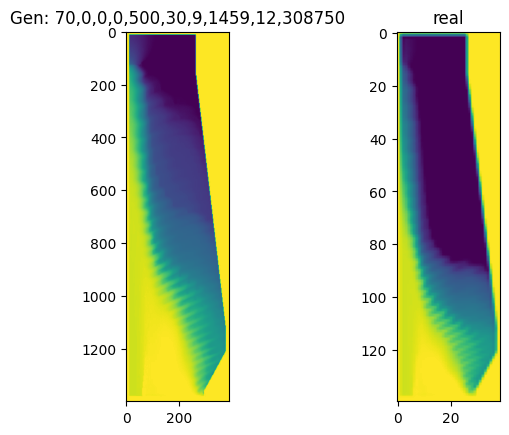

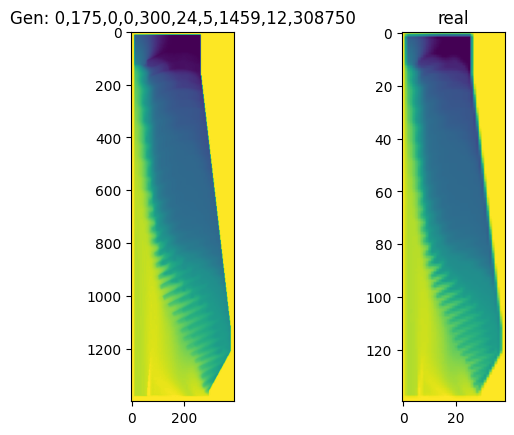

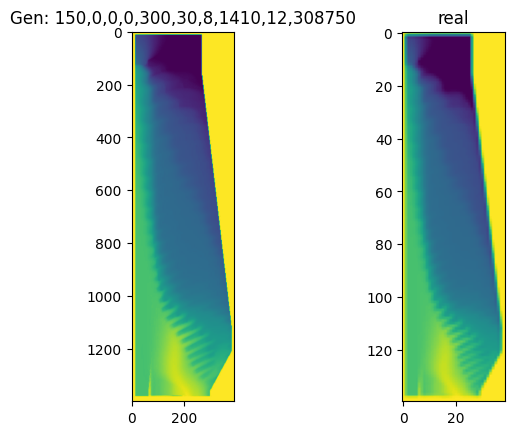

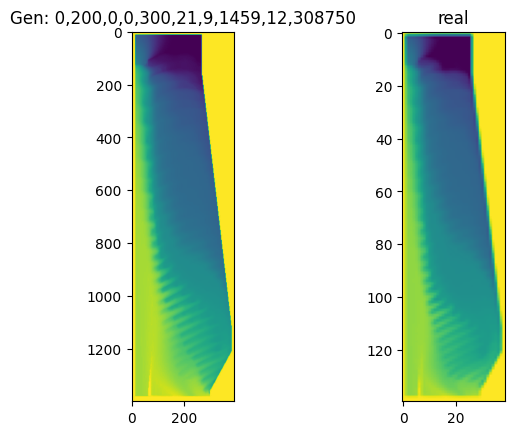

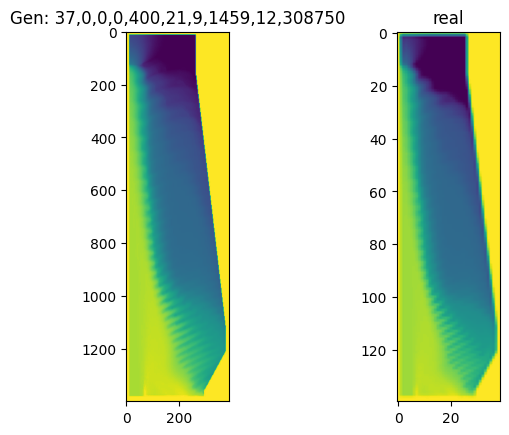

...

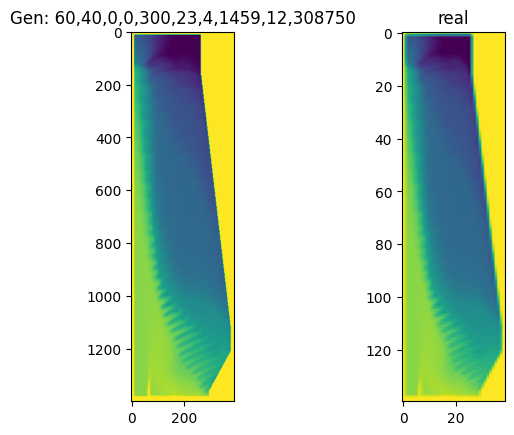

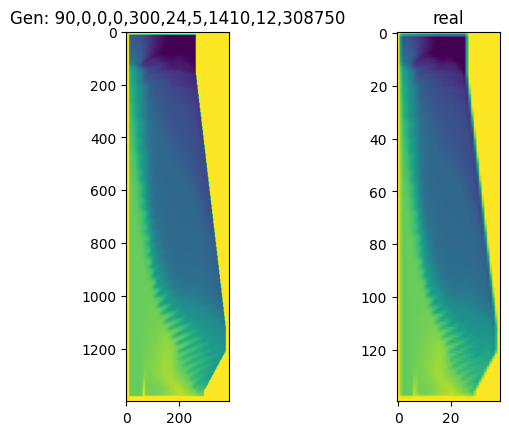

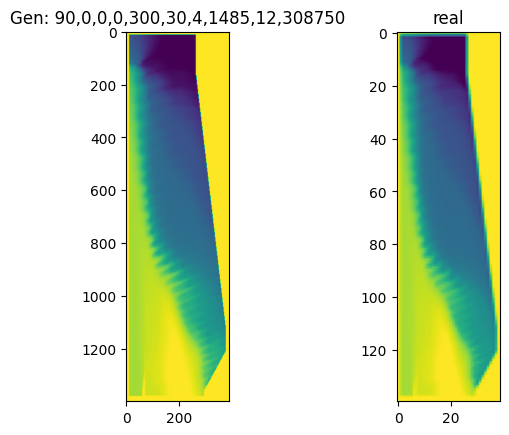

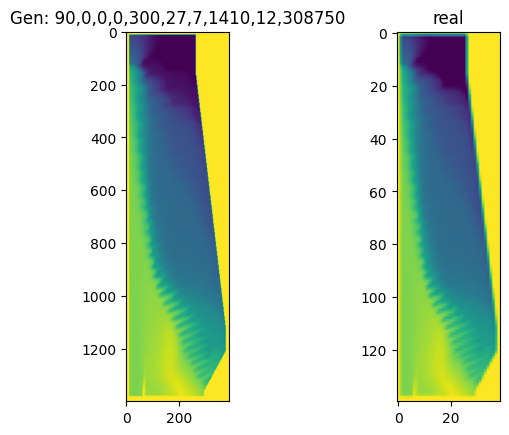

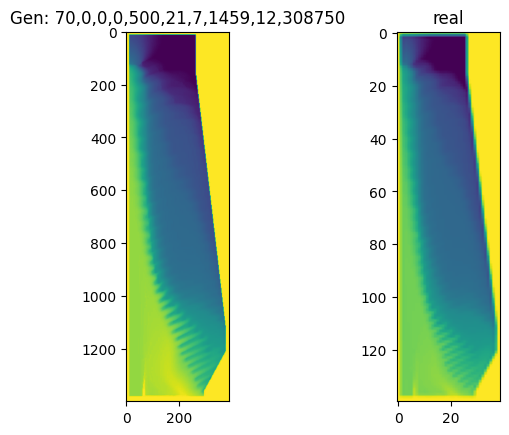

In [75]:

print( conditions_matrix_train.shape )
print( conditions_matrix_test.shape  )


for test_i in range( conditions_matrix_test.shape[0]  ):

    the_test_conditions, gen_pil_image, real_pil_image = generate_img_per_index(test_i)
    
    the_test_conditions = the_test_conditions.astype(int)
    str_conditions = np.array2string(the_test_conditions, precision=0, separator=',', suppress_small=True)
    str_conditions = str_conditions.replace(" ","")
    str_conditions = str_conditions.replace("[","")
    str_conditions = str_conditions.replace("]","")

    ## print(str_conditions)

    fig, ax = plt.subplots(1,2)
    ax[0].imshow(gen_pil_image)
    ax[1].imshow(real_pil_image)
    
    ax[0].set_title("Gen: " + str_conditions)
    ax[1].set_title("real")
